# UrbanWindow 3D, Phoenix: how much green do people see from their windows?
### I-GUIDE Summer School 2026
**Team 3: Seeing Green from Indoors**
- **Lead:** Debayan Mandal
- **Members:** Jiang Zheng, Segun Ojo, Lixi Xu, Yangchengsi Zhang

People spend most of their time indoors, yet we measure urban greenness from the **top down** (satellite NDVI). What a person sees out a window is different: **horizontal**, eye-level, and it **changes with height**. UrbanWindow 3D estimates this **window-view green ratio** for every floor of every building. We place an idealized observer at each floor along each wall and ask what it would see.

**Origin and Houston Study:**
Zongrong Li, GEAR Lab, Texas A&M (advisor Dr. Lei Zou). *Seeing Green from Indoors in 3D* (https://papers.ssrn.com/sol3/papers.cfm?abstract_id=6766522).

## Setup

In [2]:
import sys, os, json
from pathlib import Path
sys.path.insert(0, str(Path.cwd()))          
import uw_kit_withSegmented as uw
import pandas as pd, matplotlib.pyplot as plt
from PIL import Image

In [3]:
ROOT = Path.cwd()
DATA_DIR = ROOT / "data"

In [32]:
# If removal is needed
#import shutil
#shutil.rmtree(ROOT / "data", ignore_errors=True)
#shutil.rmtree(ROOT / "data_citywide", ignore_errors=True)

In [33]:
# One-time download of the representative data set
UW_DATA_URL = "https://www.dropbox.com/scl/fi/jzb6905auo0qkbvzao1wl/uw_phoenix_data.tar.gz?rlkey=3a0uikafvabs0u1c2uxyzvgpc&st=zcpt8kj2&dl=1"
uw.ensure_dataset(ROOT, UW_DATA_URL)
#DATA_DIR = ROOT / "data"
print("DATA_DIR:", DATA_DIR)

DATA_DIR: /home/jovyan/urbanwindow-phoenix/data


## Rendering the Phoenix City

Phoenix has 524,647 buildings in total (Global Building Atlas). Rendering every one is far beyond the compute budget, so we render a stratified sample of 52,784: we keep every high-rise and take a 10 percent sample of low-rise and mid-rise buildings, stratified by ZIP code and NDVI quartile so the sample still represents every neighborhood and every greenness level.

| Rise class | Number | Sampled | Rate | Rule |
|---|---|---|---|---|
| Low-rise | 519,059 | 52,012 | 10.0 % | 10 percent |
| Mid-rise | 5,471 | 655 | 12.0 % | 10 percent |
| High-rise | 117 | 117 | 100.0 % | 100 percent |
| **Total** | **524,647** | **52,784** | **10.1 %** | |

As a team of four we render these 52,784 buildings straight from Google's Photorealistic 3D Tiles on Anvil. The city is split into four slices; each person renders one quarter (about 13,000 buildings) as a batch job with their own Cesium token, and the four slices pool into one shared folder to rebuild the full dataset.

### Get onto Anvil

Go to the I-GUIDE Platform (platform.i-guide.io) -> **Anvil HPC**, or directly to OnDemand at ondemand.anvil.rcac.purdue.edu, and log in with your **ACCESS** account.
Open a terminal from **Clusters -> Anvil Shell Access**

### Get Cesium token

The renderer streams **Google's 3D Tiles** through **Cesium ion**, which needs an access token. Make your own free one so the four tokens share the city's Cesium load.
Sign up at cesium.com/ion, open **Access Tokens**, and copy your **default** token. 

### Render, Pool and Assemble


I have staged the container, the render scripts, and the four building-footprint slices (`phoenix_geojson/part_1..to..4`) in the shared project space `/anvil/projects/x-ees260113/team3/`. Export your token and submit the shared batch script with your **slice name** *(as in part_1, part_2, etc.)* as the argument:

```
export APPTAINERENV_CESIUM_ION_TOKEN=paste-your-own-token-here
cd $SCRATCH
sbatch /anvil/projects/x-ees260113/team3/render_slice.sbatch part_1
```

Check on it at any time:
```
squeue -u $USER
```

The ~13,000 buildings render on compute nodes into `phoenix_pool/` (`PD` = pending, `R` = running, `CG` = completing); you can log out and the job keeps going. Every job writes into the same `phoenix_pool/`, so the four slices pool automatically. 

When all four are in, one person assembles them into the notebook's tables in a single GPU job (never run it on login node):

```
sbatch /anvil/projects/x-ees260113/team3/assemble.sbatch
squeue -u $USER
```

### Compute resources requested

Rendering and assembly ran on **Anvil** (Purdue, via NSF ACCESS). Each job submission requested:

| Job | Partition | Nodes | Cores | Memory | GPU | Wall limit | Allocation |
|---|---|---|---|---|---|---|---|
| Render one slice (`render_slice.sbatch`) | shared | 1 | 24 | 48 GB | none | 24 h | ees260113 (CPU) |
| Assemble and segment (`assemble.sbatch`) | gpu | 1 | 16 | 64 GB | 1 x A100 | 12 h | ees260113-gpu (GPU) |

The 52,784-building city was split into four slices, and **four team members each rendered one slice in parallel**, each with their own Cesium token, for a peak of about **96 CPU cores** in use at once. One slice of roughly 13,000 buildings renders in about **17 hours** on its 24 cores (16 headless browser workers), so the four slices come to on the order of **1600 CPU core-hours** of productive rendering. In practice the work was spread over **about three days**. Jobs were relaunched as needed to clear stalled workers, which pushed the wall-clock and the charged hours above that floor. Segmentation and enrichment added a single GPU job (one A100).

Once the four slices are rendered and assembled, zip the two full-city tables (`per_viewpoint.parquet` and `phoenix_building_green_heat.gpkg`) and share them on a public Dropbox link. Running the cell below overlays them onto the data loaded in Setup, so everything below re-runs on the full city. Leave it unrun to stay on the representative sample.

In [34]:
FULLCITY_URL = "https://www.dropbox.com/scl/fo/let28huqvl3s3gs836ym3/AJoRgR8S1LytiRUyjqudJnI?rlkey=r5ukh7px3irg5wxtl1p8ic8mm&st=4ybs7pjb&dl=1"   # Replace
LOAD_FULLCITY = True    # set True after render is assembled
if LOAD_FULLCITY:
    uw.load_fullcity(ROOT, FULLCITY_URL)

full-city tables loaded into /home/jovyan/urbanwindow-phoenix/data_citywide


### Data Dictionary

**City Agnostic**: Requires building-footprint gpkg with heights and NDVI, land-surface-temperature raster, and social-vulnerability tracts. Point `make_geojson.py` and `assemble.py` at those, and the same notebook should run on any city.

In [35]:
PV     = DATA_DIR / "per_viewpoint.parquet"
GIS    = DATA_DIR / "phoenix_building_green_heat.gpkg"
MODEL  = DATA_DIR / "model" / "best_model_phoenix.pth"
LABELS = DATA_DIR / "model" / "label_colors.json"
FRAMES = DATA_DIR / "frames_sample"
print("Data stored under:", DATA_DIR)

Data stored under: /home/jovyan/urbanwindow-phoenix/data


* `data/per_viewpoint.parquet` : One row per rendered window. Green ratio, floor, orientation, location. This is produced by the render.
* `data/phoenix_building_green_heat.gpkg` : This is per building. Green, NDVI, LST, SVI, spatial clusters. This is produced by assemble.
* `data/model/best_model_phoenix.pth` : The desert adapted segmentation model.
* `data_citywide/` : Whole-city version of the Parquet and GeoPackage files.
* `houston_buildings_enriched.csv` : Houston per-building table, for the Houston comparison.

## Methodology

## Footprint to Viewpoint

We have only a footprint and a height.
Given these parameters, we decide where an observer stands and which way they look.
Floors are set to 3m. Every observer is 10m apart. The first one is set to 5m, so no one lands on the corner. Eye-height is set to 1.5m above the floor.
Our example here is of a 40m * 20m footprint, which is 30m tall.

A 30 m building has 10 floors, 120 viewpoints


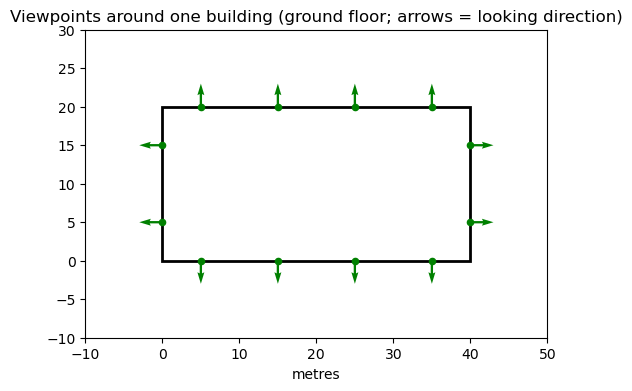

In [36]:
levels, vp = uw.viewpoints_for_box(height=30)
print(f"A 30 m building has {levels} floors, {len(vp)} viewpoints")
uw.plot_viewpoints(vp); plt.show()

## The segmentation model

Every rendered window view is turned into a per-pixel class map, and the vegetation fraction of that map is the window-view green ratio. The model that does this is a **DeepLabV3 network with a ResNet50 backbone**.

**Why this Model?** Window views are wide outdoor scenes where what matters appears at very different scales. DeepLabV3's atrous (dilated) convolutions and spatial-pyramid pooling read context at several scales at once, which fits this problem. The ResNet50 backbone, pretrained on large image collections, transfers well and fine-tunes reliably on a small labeled set, and the whole model runs at 900x900 on a single consumer GPU. It is a standard, openly available architecture, so the pipeline is easy for others to reproduce and extend. 

**Training Labels:** The Houston model fails on desert Phoenix. It reads sunlit bare ground as water and never predicts bare Terrain. Adapting it means fine-tuning on Phoenix window views, but hand-labeling every pixel is slow, so training labels are generated by making two models agree:

![Double-verified pseudo-labels: two models must agree](images/pseudo_label_workflow.png)

An ADE20K-trained SegFormer-B4 predicts a class for every pixel (collapsed to our seven classes). SAM (Segment Anything) splits the frame into class-agnostic regions. Within each SAM region we take the majority SegFormer class and snap the whole region to it. The agreement fraction is a confidence score, and low-agreement regions are flagged. The result is a refined seven-class label per frame.

**Fine-tuning.** We fine-tune the Houston model on 210 Phoenix frames, split 80/20 into 168 for training and 42 held out for evaluation. The 168 frames are labeled using the mechanism shown above. The adaptation fixes the desert failures: bare ground becomes Terrain (red) instead of water (purple), and vegetation is recovered.

![Segmentation before and after fine-tuning](images/segmentation_before_after.png)

*Left: Rendered window view. Middle: Houston base model. Right: After desert adaptation.*

**Validation:** We hand-labeled the held-out 20% (here, the 42 frames) in Label Studio and score the model against those masks, reporting per-class IoU on the labeled pixels.

## Finetuning the model

The segmentation model was trained on **Houston**. On desert Phoenix it failed: on a held-out test set it scored **0.00 IoU on Terrain** (it had never seen bare desert) and **0.17 on Vegetation**. After fine-tuning on 168 Phoenix frames with the double-verified pseudo-labels described earlier, the same held-out test jumped to **Terrain 0.31, Vegetation 0.41, Road 0.16 -> 0.40, Building 0.69 -> 0.82, Sky 0.88 -> 0.99**. That is the desert adaptation.

Training is GPU work, so it runs in an **Anvil GPU session**, not in this notebook. To adapt the model to a different city: render a small set of that city's window views, build the same refined pseudo-label masks, and fine-tune the Houston base with the same recipe (an 80/20 train and held-out split, the DeepLabV3 head reshaped to our eight indices, a few epochs at a low learning rate), saving the new checkpoint under a distinct name. Validate the result against a hand-labeled held-out set, as described earlier. The Phoenix training set reproduces the desert adaptation exactly; swap in your own city's frame and mask pairs to fit its morphology. In an Anvil terminal:
```
# 1. Grab a short GPU session:
sinteractive -A ees260113-gpu -p gpu --gres=gpu:1 -t 00:30:00

# 2. On the GPU node, fine-tune (try 1 epoch first, then 8):
cd /anvil/projects/x-ees260113/team3/finetune_kit
apptainer exec --nv --bind "$PWD" /anvil/projects/x-ees260113/team3/urbanwindow3d.sif \
    python finetune.py --frames trainset_frames --masks trainset_labels \
    --weights best_model_base.pth --out best_model_NewCity.pth --epochs 8
```

## Render and Feed to Segmentation

This renders a 900 * 900 photo, then labels every pixel with **DeepLabV3**. The desert-adapted model is used. First, one frame:

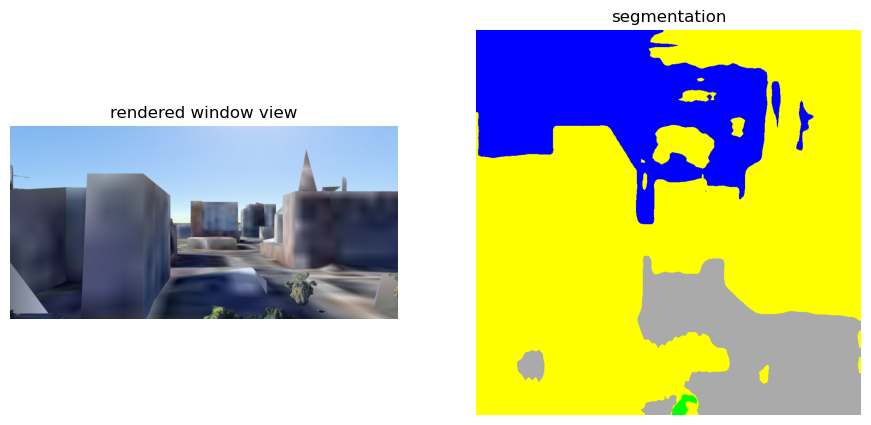

green ratio (Vegetation): 0.002


In [37]:
model  = uw.load_segmenter(MODEL)
labels = json.loads(Path(LABELS).read_text())
img = Image.open(sorted(FRAMES.glob("*.jpg"))[0]).convert("RGB")
mask, ratios = uw.segment_image(img, model, labels)
fig, ax = plt.subplots(1, 2, figsize=(11, 5))
ax[0].imshow(img);  ax[0].axis("off"); ax[0].set_title("rendered window view")
ax[1].imshow(mask); ax[1].axis("off"); ax[1].set_title("segmentation")
plt.show()
print("green ratio (Vegetation):", round(ratios["Vegetation"], 3))

Now we point the segmenter at a folder of rendered frames and get a per-frame ratios table. Each row's green column is that window's green ratio.

In [38]:
ratios_df = uw.segment_folder(FRAMES, model, labels, limit=12)
print(ratios_df.shape[0], "frames -> green ratios")
ratios_df[["filename", "green", "Building", "Sky", "Road", "Terrain"]].round(3).head()

12 frames -> green ratios


,filename,green,Building,Sky,Road,Terrain
0,building_1106850_facade8_floor9_h270.jpg,0.002,0.628,0.220,0.151,0.000
1,building_1233033_facade0_floor1_h0.jpg,0.000,0.446,0.418,0.134,0.002
2,building_1862943_facade0_floor1_h179.jpg,0.001,0.988,0.000,0.011,0.000
3,building_2002624_facade3_floor1_h269.jpg,0.000,0.604,0.298,0.076,0.022
4,building_2155409_facade1_floor3_h115.jpg,0.000,0.778,0.194,0.020,0.008


## Result: We get the resultant tables (per-viewpoint and per-building)

Here we will use a sample where we deliberately chose three Phoenix neighborhoods that span the **urban-form gradient**:

| Neighborhood | ZCTA  | Urban form                                             |
|--------------|-------|--------------------------------------------------------|
| Downtown     | 85004 | High-rise, tall towers, dense, little ground green     |
| Tempe / ASU  | 85281 | Mid-rise, mixed heights, campus and apartments         |
| Arcadia      | 85016 | Suburban, low-rise homes, mature yard trees            |

In [39]:
pv = uw.load_viewpoints(PV)
g  = uw.load_buildings(GIS)
print(f"{len(pv):,} viewpoints, {pv.osm_id.nunique():,} buildings; per-building layer: {len(g)} rows")
pv[["zcta", "rise_class", "floor", "height_m", "green", "ndvi"]].head()

17,318 viewpoints, 2,104 buildings; per-building layer: 1852 rows


,zcta,rise_class,floor,height_m,green,ndvi
0,85004,high_rise,1,68.463211,0.000000,-0.002658
1,85004,high_rise,11,68.463211,0.000000,-0.002658
2,85004,high_rise,22,68.463211,0.079019,-0.002658
3,85004,high_rise,1,68.463211,0.000000,-0.010946
4,85004,high_rise,11,68.463211,0.001623,-0.010946


### Question 1: Does a building that looks green from a satellite also look green from it's windows?

per-building green vs NDVI: r = 0.51  (n=2104)


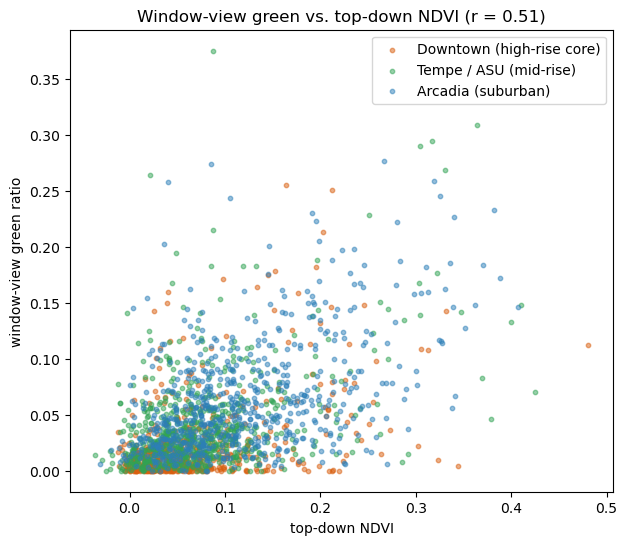

In [40]:
pb = uw.per_building_green_ndvi(pv)
print(f"per-building green vs NDVI: r = {pb.green.corr(pb.ndvi):.2f}  (n={len(pb)})")
uw.plot_green_vs_ndvi(pb); plt.show()

* **r = 0.51** is a **moderate positive correlation**. Greener-from-above places do tend to have somewhat greener window views.
* **r-squared=0.26**, so NDVI explains about a quarter of the variation in window-green. The other 74% cannot be accounted for in the top-down view.

*NDVI is good at capturing neighborhood, not the building.*
Note: SAVI maybe worth checking too.

### Question 2: Would you expect higher floors to see more green or less? Does it depend on the building type?

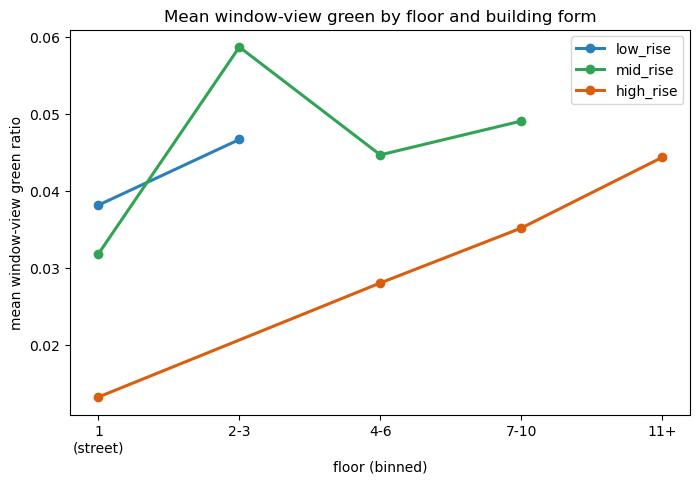

In [41]:
uw.plot_green_by_floor(pv); plt.show()

* **Low-Rise:** Greenery is quite decent at the street and then barely rises. Suburbanites don't need height to see green.
* **Mid-Rise:** Rises a crest at height 2-3. Presumably in level with the tree canopies. Most mid-rise viewpoints are clustered in that bin.
* **High-Rise:** It is very low at the street. A Downtown tower's ground view is mostly walls, roads and other buildings. It rises steadily with height as the view rises over the built-clutter.

*NDVI gives one number per location. Here, we can observe the vertical pattern more minutely, even within one building itself.*

**Notes:** 
* The 2-3 is missing from the high-rise due to a per-building viewpoint cap. It is a budget constraint set for Cesium usage. We didn't sample it.
* For our sample majority of the high-rises came from Downtown area. Mid-rises are more prevalent in Tempe area.

Viewpoint-counts:
|         | Downtown 85004 |	Arcadia 85016 |	Tempe 85281 |
|---------|----------------|------------------|-------------|
|High-rise|	414 | 180 | 168 |
|Mid-rise|	1,759 |	2,727 |	4,935 |
|Low-rise|  2,355 |	2,614 |	2,156 |

### Floor height vs. temperature and building form

Extending the floor analysis with surface temperature, and how it relates to window-view green across building forms.

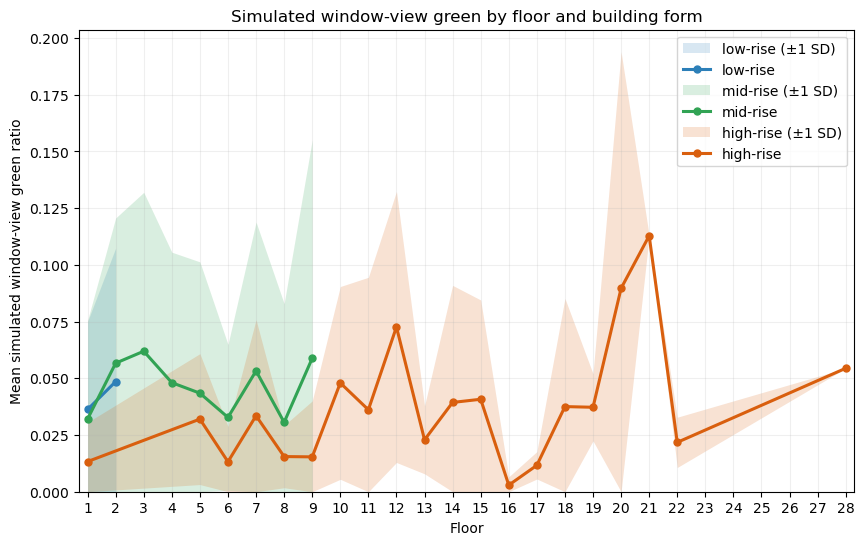

In [44]:
fig, ax = plt.subplots(figsize=(10, 6))

uw.plot_con_green_by_floor(
    pv,
    ax=ax,
    min_buildings=1,
    building_weighted=True,
    show_counts=False
)

plt.show()

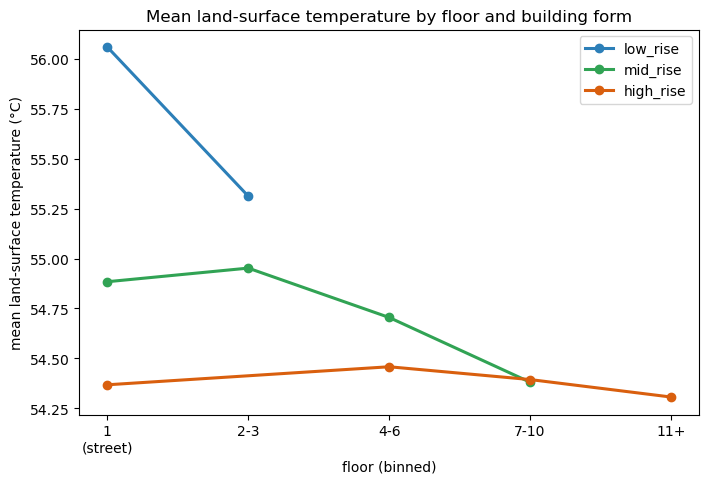

In [45]:
uw.plot_lst_by_floor(pv, g)

plt.show()

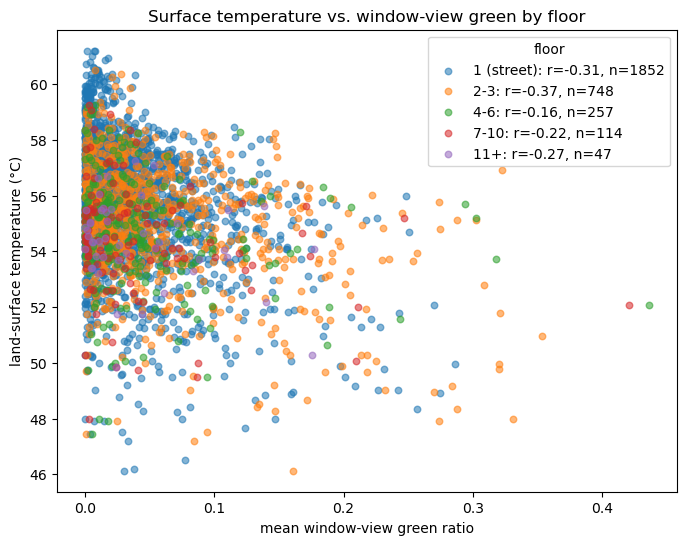

In [46]:
uw.plot_lst_vs_green_by_floor(pv, g)

plt.show()

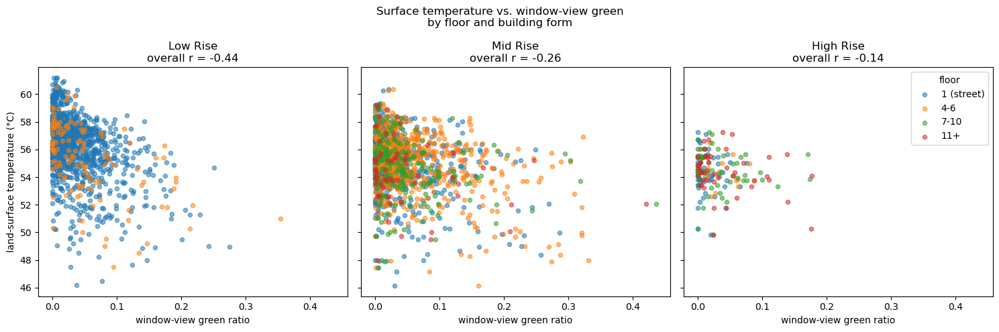

In [47]:
uw.plot_lst_vs_green_by_building_form(pv, g)

plt.show()

### Question 3: Do greener buildings sit on cooler surfaces?

In [48]:
for c in ["green", "ndvi", "svi"]:
    print(f"  {c:5s} vs LST:  r = {g[c].corr(g.lst):+.2f}")
uw.heat_divergence(g)

  green vs LST:  r = -0.39
  ndvi  vs LST:  r = -0.35
  svi   vs LST:  r = +0.51


{'hidden_green': (54.582857142857144, 91),
 'typical': (55.83363333333333, 600),
 'exposed': (55.67489795918367, 98)}

**Terms:**
* LST: *Land Surface Temperature* from Landsat in Celsius.
* green: *Window-view green ratio*
* ndvi: *Normalized Difference Vegetation Index*
* svi: *CDC Social Vulnerability Index*
* r: Pearson Correlation
* hidden green: NDVI says bare, but window says green
* exposed: NDVI says green, but window says bare.

**Result:**
* **green vs LST = −0.39** : Greener buildings sit on cooler surfaces.
* **ndvi vs LST = −0.35** : Satellite-green is also cooler, but slightly weaker than window-green. Very small margin however (0.04).
* **svi vs LST = +0.51** : More vulnerable areas are hotter.

| Group | mean LST | n |
|---|---|---|
| hidden_green | 54.58°C | 91 |
| typical | 55.83°C | 600 |
| exposed |  55.67°C | 98 |

* **Hidden Green buildings are cooler by ~1.1°C than exposed buildings.** So when the two measures conflict, the window-view goes with the cooler surface. The caveat, however, is the disagreements are in smaller numbers and gaps.

### Question 4: Is greenery or heat, evenly distributed?

Each building inherit's its tract's CDC SVI.

SVI vs green: -0.29    SVI vs LST: 0.51


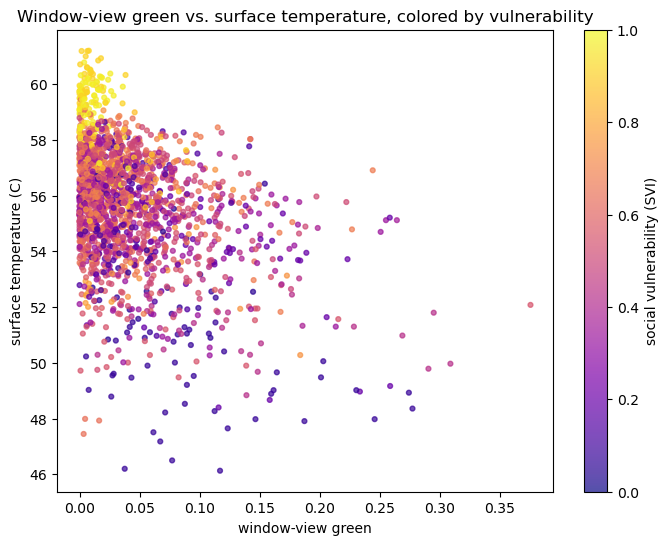

{'most_vulnerable': (0.02735955223880597, 56.93161194029851, 670),
 'least_vulnerable': (0.05994095394736843, 54.51560855263159, 608)}

In [49]:
print("SVI vs green:", round(g.svi.corr(g.green), 2), "   SVI vs LST:", round(g.svi.corr(g.lst), 2))
uw.plot_equity_corner(g); plt.show()
uw.equity_split(g)

**Results:**
* **SVI vs green = −0.29** : More vulnerable buildings have less window-green.
* **SVI vs LST = +0.51** More vulnerable buildings sit on hotter surfaces.

| Group | mean window-green | mean surface temp | n |
|---|---|---|---|
| Most vulnerable (top third SVI) | 0.027 | 56.9°C | 670 |
| Least vulnerable (bottom third SVI) | 0.060 | 54.5°C | 608 |

So the most vulnerable buildings have less than half the window-green and are ~2.4°C hotter.

### Question 5: Are the patterns spatially clustered, and where do low-green and high-heat overlap?

In [18]:
%pip install -q libpysal esda

Note: you may need to restart the kernel to use updated packages.


In [19]:
print("double-burden hotspots:", len(uw.double_burden(g)))
{k: (round(v.I, 2), round(v.p_sim, 3)) for k, v in uw.morans(g).items()}

double-burden hotspots: 238


/home/jovyan/.local/geoai-py3-0.9.5/lib/python3.9/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 4 disconnected components.
  warnings.warn(message)


{'green': (0.42, 0.005), 'lst': (0.8, 0.005), 'svi': (0.95, 0.005)}

**Results:**
* **green: ( Moran's I=0.42, p=0.005):** Window-green is moderately clustered in space. Statistically significant.
* **lst: ( Moran's I=0.80, p=0.005):** Surface heat is strongly clustered. Heat comes in large contiguous zones. Statistically significant.
* **svi: ( Moran's I=0.95, p=0.005):** This result is not useful. SVI is assigned per census tract, so every building in a tract shares one value, which forces near-total clustering by construction.
* The *warning* is because the neighborhoods aren't connected.

## Visualization

Let's map it.
Projection: EPSG:32612

In [20]:
%pip install -q contextily

Note: you may need to restart the kernel to use updated packages.


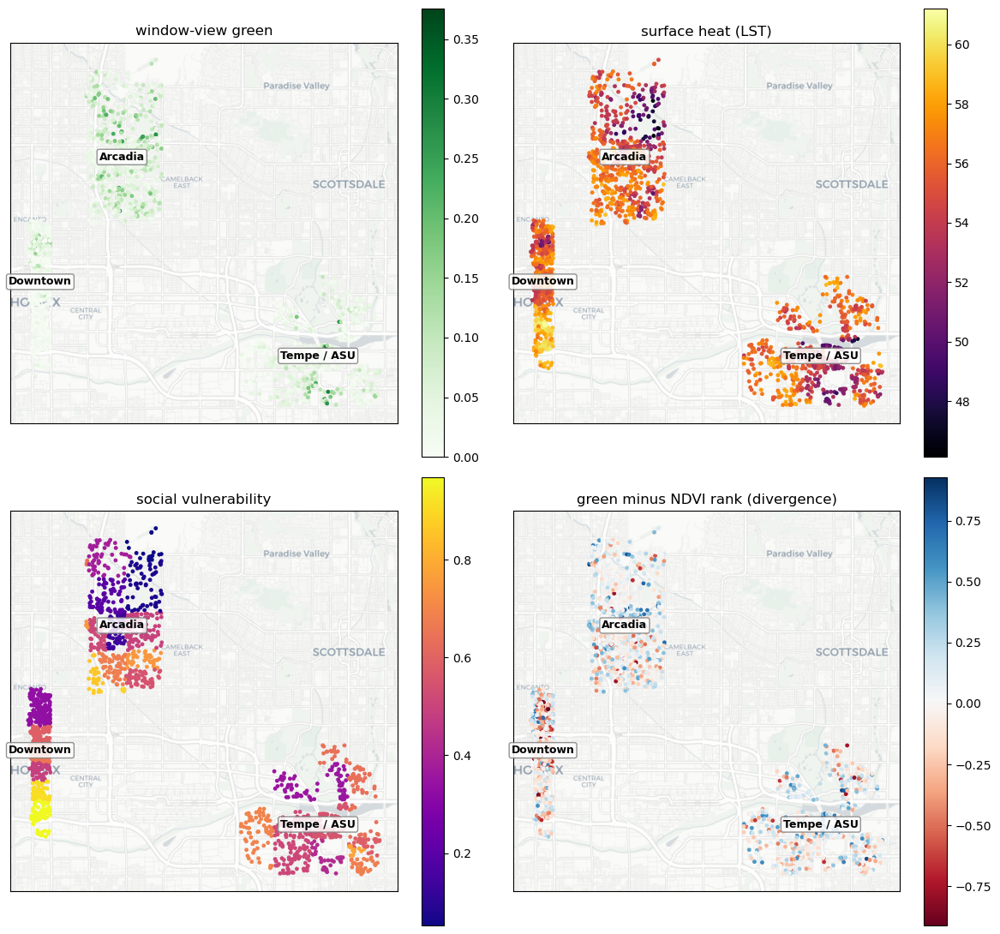

In [21]:
uw.plot_maps(g); plt.show()

# City-Wide Analysis

Let's check if the same results are obtained when the analysis is done citywide.
Use the full-city render if done. Otherwise use the representative 12,000-building sample and try the comparisons again.

In [4]:
CITYWIDE = DATA_DIR.parent / "data_citywide"     # 12k city-wide sample (the full 52k run drops in here later)
g_city = uw.load_buildings(CITYWIDE / "phoenix_building_green_heat.gpkg")
print(f"city-wide buildings: {len(g_city):,}   ({(g_city.rise_class == 'low_rise').mean():.0%} low-rise)")

city-wide buildings: 51,519   (99% low-rise)


The current representative dataset has 12k buildings. Majority of which is low-rise, depicting the city of Phoenix correctly.

## Question 1: NDVI vs Window-Heat

City-wide per-building green vs NDVI: r = 0.32 (n=51,515)


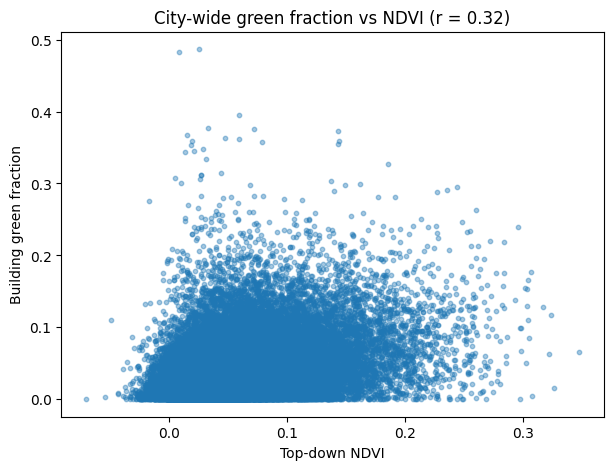

In [5]:
pb2 = uw.per_building_green_ndvi_city(g_city)
print(f"City-wide per-building green vs NDVI: r = {pb2.green.corr(pb2.ndvi):.2f} (n={len(pb2):,})")
uw.plot_green_vs_ndvi_city(pb2)
plt.show()

## Question 2: Window-Green trend with floor

In [6]:
pv_city = uw.load_viewpoints(CITYWIDE / "per_viewpoint.parquet")
gn = g_city[["osm_id", "ndvi"]].copy()
gn["osm_id"] = gn["osm_id"].astype(str)
pv_city["osm_id"] = pv_city["osm_id"].astype(str)
pv_city = pv_city.merge(gn.drop_duplicates("osm_id"), on="osm_id", how="left")
print(f"City-wide viewpoints: {len(pv_city):,}   buildings: {pv_city.osm_id.nunique():,}")

City-wide viewpoints: 375,463   buildings: 51,519


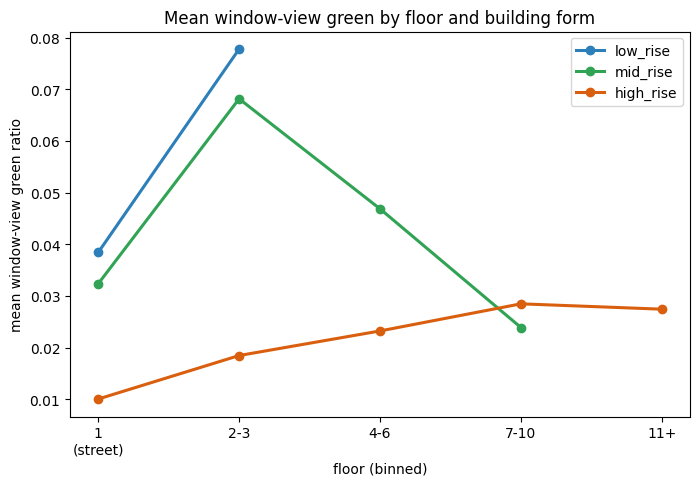

In [7]:
uw.plot_green_by_floor(pv_city, zctas=None)

plt.show()

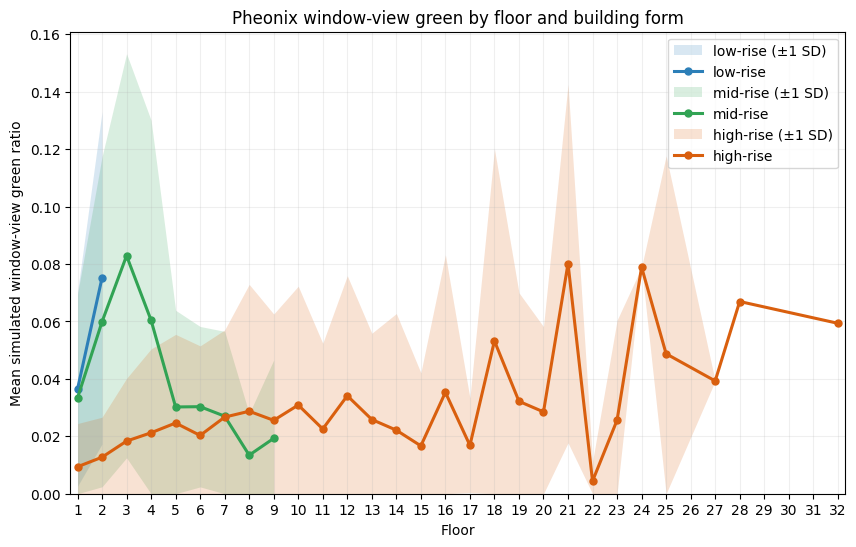

In [8]:
import importlib

uw = importlib.reload(uw)

fig, ax = plt.subplots(figsize=(10, 6))

uw.plot_con_green_by_floor(
    pv_city,
    ax=ax,
    zctas=None,
    min_buildings=1,
    building_weighted=True,
    show_counts=False
)

plt.show()

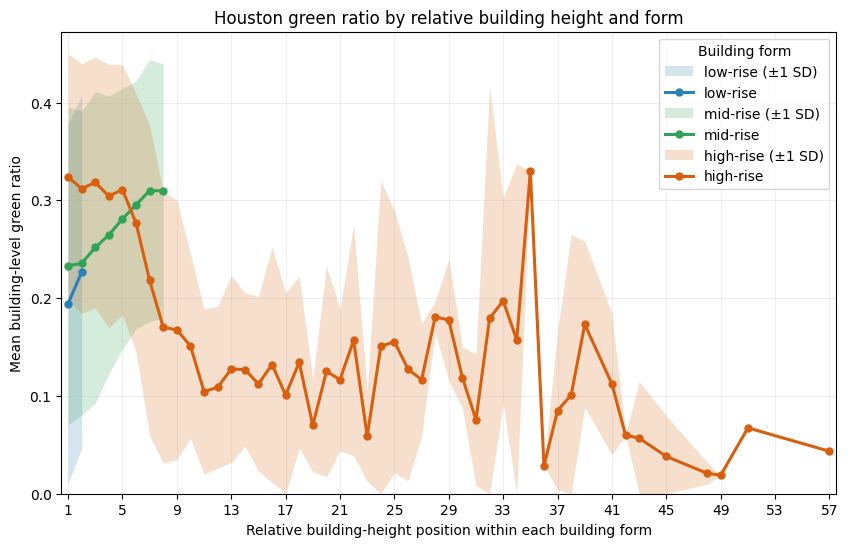

In [9]:
# For Houston
import importlib
importlib.reload(uw)
hou = uw.load_houston(DATA_DIR.parent / "houston_buildings_enriched.csv")

fig, ax = plt.subplots(figsize=(10, 6))

uw.plot_houston_green_by_floors(
    hou,
    ax=ax,
    min_count=1,
    show_counts=False
)

plt.show()

## Question 3: Urban Heat

In [10]:
g_heat_city = uw.prepare_citywide_heat_data(g_city)

print("City-wide correlations with LST:")
for c in ["green", "ndvi", "svi"]:
    print(f"  {c:5s} vs LST: r = {g_heat_city[c].corr(g_heat_city['lst']):+.2f}")

heat = uw.heat_divergence_city(g_heat_city)
heat_table = (
    pd.DataFrame(heat, index=["Mean LST (°C)", "Count"])
      .T
      .rename_axis("Group")
      .reset_index()
)
heat_table["Mean LST (°C)"] = heat_table["Mean LST (°C)"].round(2)
heat_table["Group"] = heat_table["Group"].str.replace("_", " ").str.title()
print(heat_table)

City-wide correlations with LST:
  green vs LST: r = -0.34
  ndvi  vs LST: r = -0.50
  svi   vs LST: r = +0.54
          Group  Mean LST (°C)    Count
0  Hidden Green          57.09   3635.0
1       Typical          57.10  16975.0
2       Exposed          55.90   3882.0


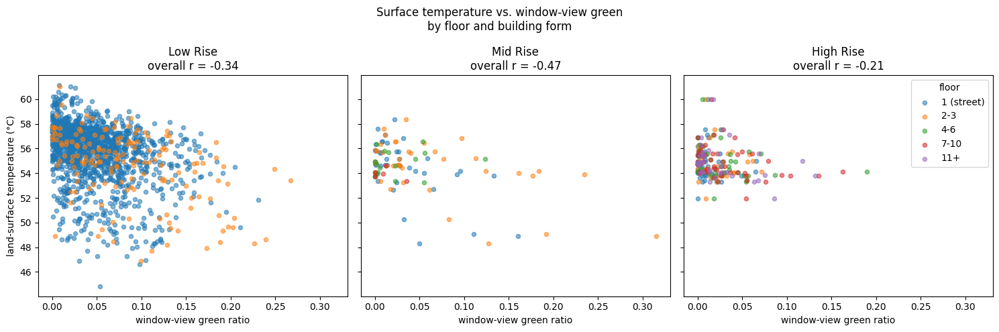

In [11]:
uw.plot_lst_vs_green_by_building_form(pv_city, g_city)

plt.show()

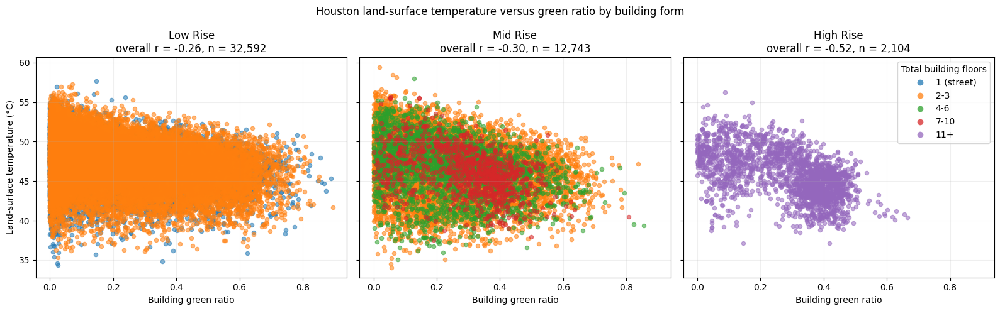

In [12]:
# For houston
import importlib
importlib.reload(uw)
uw.plot_houston_lst_vs_green_by_building_form(
    hou,
    lst_col='lst',
    green_col='green',
    floor_col='n_floors',
    rise_col='rise_class'
)

plt.show()

*Response*: 
- We might say urban heat is not solely influenced by visible vegetation.
- In essence, vegetation alone does not fully explain urban heat patterns.
- Vegetation and urban heat have a more complicated relationship.
- Although vegetation aids in cooling, its effects may be outweighed by urban design, the makeup of the land cover, and socioeconomic circumstances.

##### Heat divergence findings

1. On average, exposed buildings (high NDVI, low window-green) are the coolest.
2. Typical buildings stay the warmest.
3. Hidden-green buildings fall in between.

#### City-wide heat by vegetation-view category

Exposed, typical, and hidden-green buildings shown together: their spatial distribution (A), their land-surface-temperature distributions (B), and where they sit in the green-vs-NDVI space (C).

       Group  Mean_LST  Median_LST   SD  CI95     n
Hidden Green     57.09       57.32 1.84  0.06  3644
     Typical     57.10       57.40 2.16  0.03 16999
     Exposed     55.90       56.05 2.20  0.07  3892


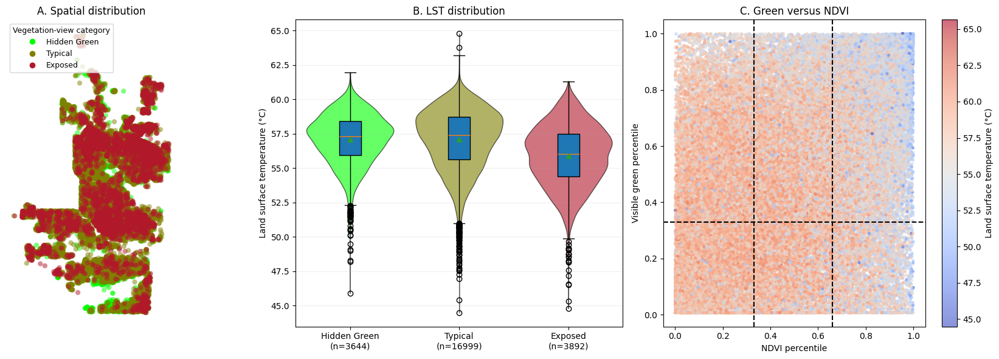

In [13]:
uw.plot_heat_panels(g_city)
plt.show()

## Question 4: Social Vulnerability

SVI ~ green: r = -0.270, p = 0.0e+00, n = 51,442  *
SVI ~ LST: r = +0.542, p = 0.0e+00, n = 51,442  *
(sample baselines: SVI~green -0.29, SVI~LST +0.51)


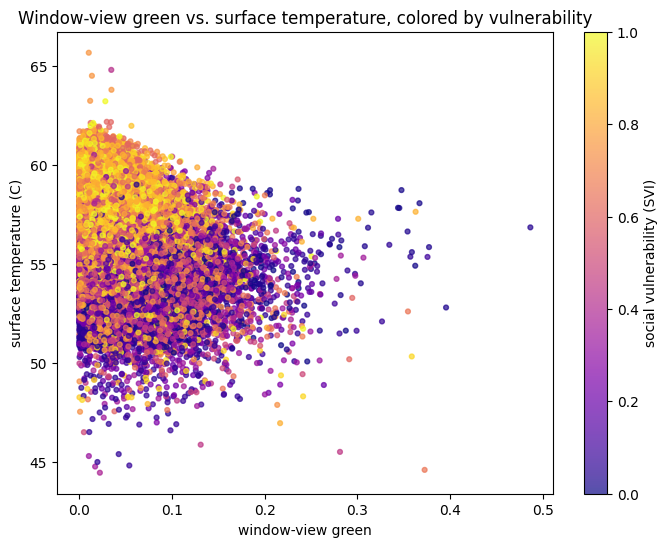

{'most_vulnerable': (0.030078506370433442, 58.07753691368892, 17514),
 'least_vulnerable': (0.053267195733673035, 55.19945181782771, 16983)}

In [14]:
# City-wide Q4: are green and heat distributed evenly across social vulnerability?
# Correlations with significance: Pearson r, two-sided p-value, n (* = p < 0.05).
for driver, tgt, name in [("svi", "green", "SVI ~ green"), ("svi", "lst", "SVI ~ LST")]:
    r, p, n = uw.corr_p(g_city[driver], g_city[tgt])
    mark = "*" if p < 0.05 else "(n.s.)"
    print(f"{name}: r = {r:+.3f}, p = {p:.1e}, n = {n:,}  {mark}")
print("(sample baselines: SVI~green -0.29, SVI~LST +0.51)")
uw.plot_equity_corner(g_city); plt.show()
uw.equity_split(g_city)

Sample baselines: SVI~green = -0.29, SVI~LST = +0.51 (most-vulnerable buildings had roughly half the window-green and were ~2.4 C hotter). Check whether the same double disadvantage holds across the whole city.

## Question 4A: Social & Economic Dimension

Decomposes the single composite SVI into its social / economic components and tests which one drives the green / heat gap.

**What this section does**
1. **Adds the sub-indices** - spatially joins CDC SVI 2022 to recover the 4 theme percentiles (socioeconomic, household, minority, housing/transport) per building.
2. **Tract-level aggregation** - averages window-green to census tract, SVI's native resolution.
3. **Analysis** - scatter plots (building & tract level), an LMG / Shapley variance decomposition, and standardized regression (tract-level, and building-level with tract-clustered SE).
4. **Key findings**
   - Racial/ethnic minority (THEME3) is the largest contributor (~45% of explained variance); socioeconomic status (THEME1) second (~36%).
   - The link is weak per building (R²≈0.11) but ~3.6× stronger aggregated to tract (R²≈0.39) - building-to-building green noise is unrelated to SVI.
   - More vulnerable tracts have less window-green and higher surface heat.
   - THEME1 and THEME3 are collinear (r≈0.80), hard to separate; housing/transport (THEME4) is much weaker (r≈-0.09, ~4% of explained variance).

### Extending Q4 - from one SVI number to its social components

The baked `svi` column is only the **composite** index. CDC/ATSDR's SVI bundles **15 census variables into 4 themes**, each reported as a percentile rank. Decomposing it shows *which* dimension of vulnerability tracks with window-view green and heat.

**The four themes (SVI 2022):**

| Theme | Captures |
|---|---|
| `RPL_THEME1` Socioeconomic status | below 150% poverty, unemployment, housing-cost burden, no high-school diploma, no health insurance |
| `RPL_THEME2` Household characteristics | aged ≥65, aged ≤17, disability, single-parent households, limited English |
| `RPL_THEME3` Racial & ethnic minority | share in racial / ethnic minority groups |
| `RPL_THEME4` Housing type & transportation | multi-unit & mobile homes, crowding, no vehicle, group quarters |

**About the index:**
- Values are **percentile ranks 0-1** (higher = more vulnerable); `RPL_THEMES` is the overall composite.
- **SVI 2022** was **released May 2024**, and is the **first edition also offered at ZIP Code Tabulation Area (ZCTA) level** (alongside tract and county).
- We use the **tract-level** file for Maricopa County (1,009 tracts).

**Linking each building to a tract:**
- Building footprints (GlobalBuildingAtlas) carry only a ZIP (`zcta5`) - **no tract id**.
- So each building point (`lon`, `lat`) is **spatially joined** into the tract polygon that contains it, inheriting that tract's theme percentiles.
- **Validated:** this join reproduces the pre-baked composite `svi` *exactly* (zero difference), so the sub-themes are trustworthy. ~14 buildings fall in suppressed / zero-population tracts → `NaN`.

> Requires `data/svi_2022_maricopa_tracts.gpkg` (from the Anvil `team3/` kit); not committed to the repo.

In [15]:
# Spatial join: attach GEOID + RPL_THEME1..4 to each building
SVI_TRACTS = DATA_DIR / "svi_2022_maricopa_tracts.gpkg"
g_se = uw.attach_svi_themes(g_city, SVI_TRACTS)

**How SVI is attached & aggregated**
- *Per building:* each building point (`lon`, `lat`) is spatially joined into the census tract polygon that contains it (point-in-polygon); it inherits that tract's composite SVI and 4 theme percentiles. SVI is constant within a tract.
- *Per tract:* for tract-level scatters, maps, and regressions, window-green is averaged over the buildings in each tract (mean by `GEOID`); SVI / themes are already tract-constant, so their per-tract value is unchanged.

In [16]:
# Correlation of each SVI measure with window-green and surface heat
uw.svi_theme_summary(g_se)

,theme,r~green,p~green,r~lst,p~lst
0,composite (RPL_THEMES),-0.270,0.0e+00 *,0.542,0.0e+00 *
1,RPL_THEME1 (socioeconomic status),-0.294,0.0e+00 *,0.588,0.0e+00 *
2,RPL_THEME2 (household characteristics),-0.225,0.0e+00 *,0.465,0.0e+00 *
3,RPL_THEME3 (racial & ethnic minority),-0.316,0.0e+00 *,0.566,0.0e+00 *
4,RPL_THEME4 (housing & transport),-0.091,2.2e-95 *,0.197,0.0e+00 *


**1. Does vulnerability track with window-view green?**

*Building level* (~51,000 buildings) - composite first, then the four themes side by side, each with a linear fit.

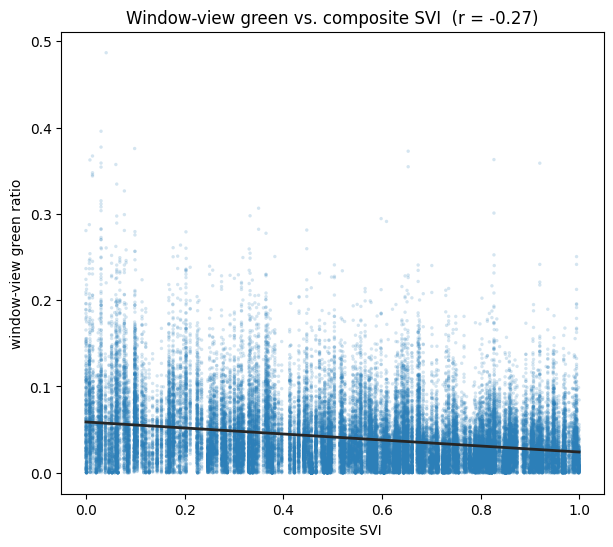

In [17]:
uw.plot_svi_vs_green(g_se, "svi"); plt.show()

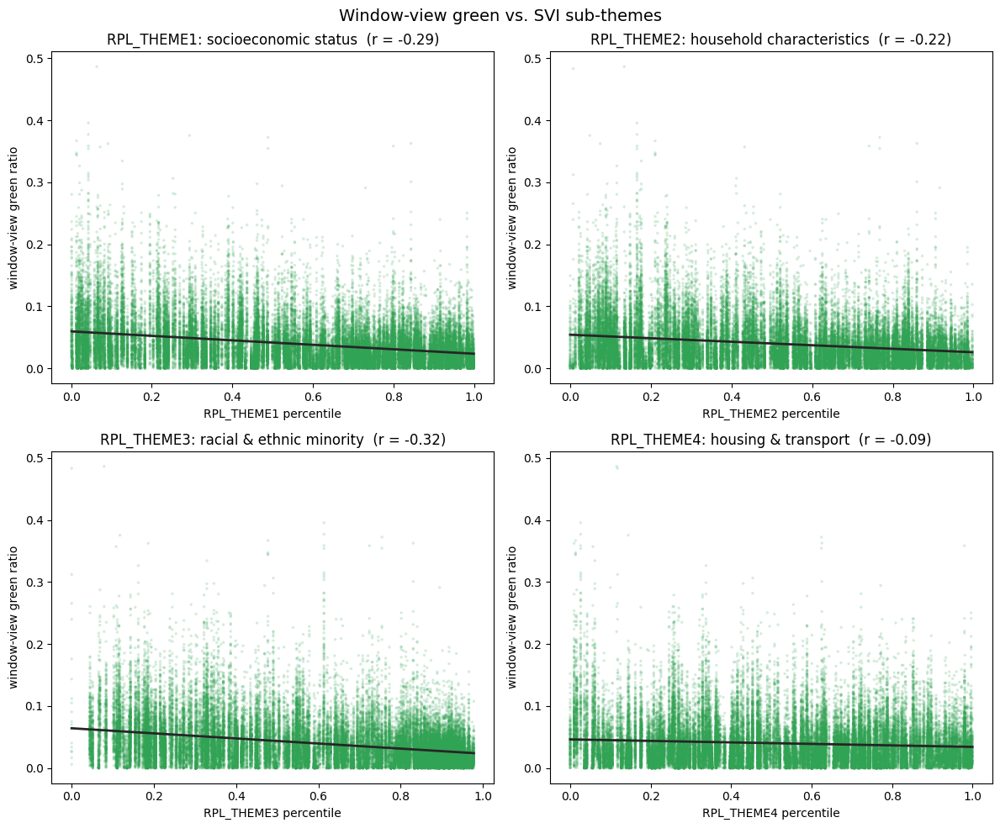

In [18]:
uw.plot_svi_themes_vs_green(g_se); plt.show()

*Census-tract level* - window-green averaged per tract (~380 tracts). SVI is a tract-level measure, so this is the matched resolution: building-to-building noise is averaged out and the relationship comes through more clearly (composite r goes from about -0.27 to -0.52).

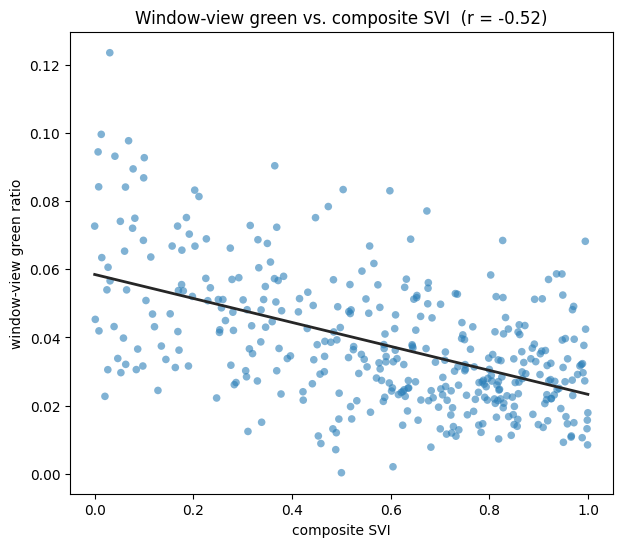

In [19]:
g_tract = uw.to_tract(g_se)
uw.plot_svi_vs_green(g_tract, "svi"); plt.show()

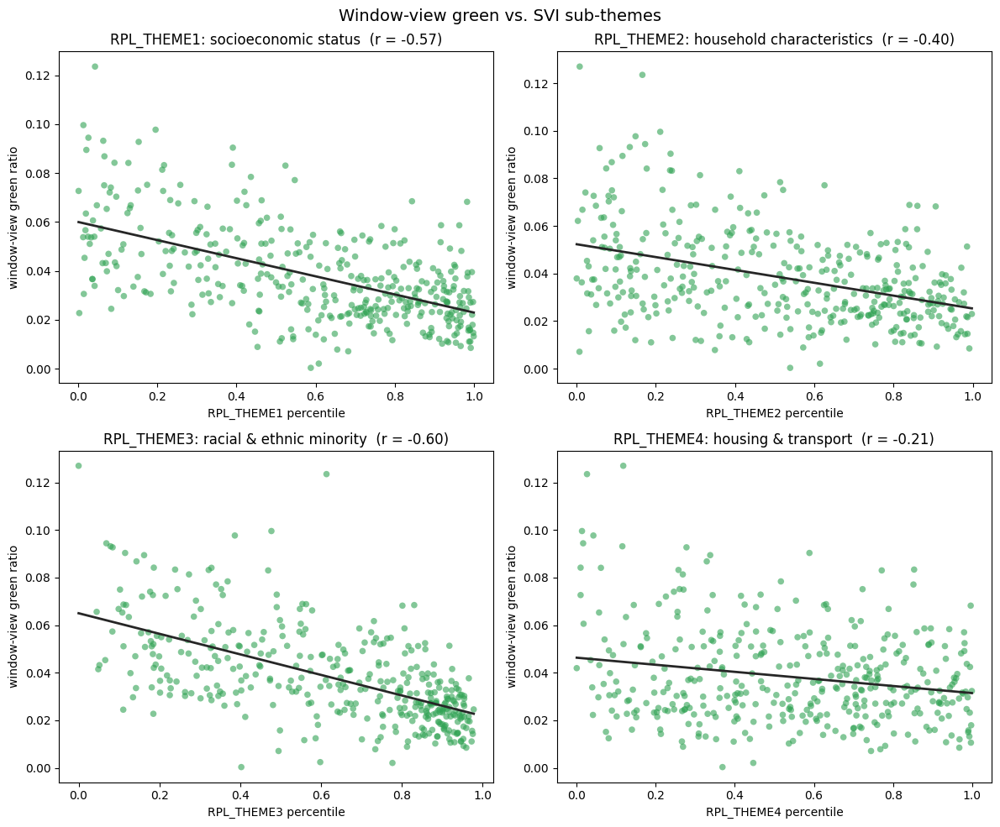

In [20]:
uw.plot_svi_themes_vs_green(g_tract); plt.show()

**Which theme contributes most?** Standardized regression of green on all four themes at once, plus an LMG / Shapley split of the explained variance (robust to the themes being correlated).

Read with three caveats:
- **R² is small** (~0.11 building, ~0.39 tract): SVI explains only a slice of window-green.
- **SVI is tract-level**, so we report a tract-aggregated fit and a building-level fit with tract-clustered standard errors side by side.
- **THEME1 and THEME3 are collinear** (r≈0.80), so their individual betas trade off.

In [21]:
# LMG / Shapley: each theme's share of explained variance
uw.svi_relimp(g_se)

,theme,lmg_R2_share,pct_of_explained
0,RPL_THEME1 (socioeconomic status),0.0384,35.8
1,RPL_THEME2 (household characteristics),0.0165,15.4
2,RPL_THEME3 (racial & ethnic minority),0.0482,44.9
3,RPL_THEME4 (housing & transport),0.0043,4.0


In [22]:
# Standardized regression, tract level (~380 tracts)
uw.svi_regression(g_se, level="tract")

,theme,std_beta,p,R2,n
0,RPL_THEME1,-0.379,0.0000,0.389,380
1,RPL_THEME2,0.047,0.3962,0.389,380
2,RPL_THEME3,-0.362,0.0000,0.389,380
3,RPL_THEME4,0.130,0.0097,0.389,380


In [23]:
# Standardized regression, building level, cluster-robust SE by tract
uw.svi_regression(g_se, level="building")

,theme,std_beta,p,R2,n
0,RPL_THEME1,-0.164,0.0011,0.107,51442
1,RPL_THEME2,-0.005,0.8742,0.107,51442
2,RPL_THEME3,-0.204,0.0001,0.107,51442
3,RPL_THEME4,0.068,0.0100,0.107,51442


**2. Green vs. surface heat, colored by vulnerability** - the equity corner (bottom-right = low green, high heat, most vulnerable).

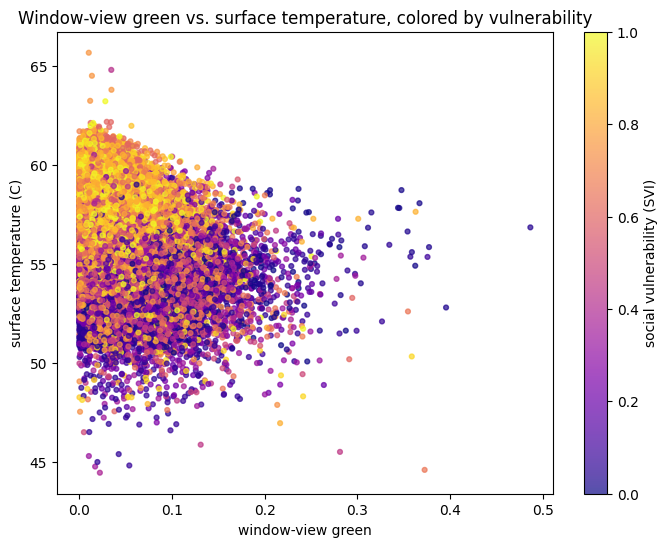

In [24]:
uw.plot_equity_corner(g_se); plt.show()

**3. Does the link hold at every floor?**

The correlations above are building-level. SVI is a building attribute, so here window-green is averaged to one value per building *within each floor bin*, then correlated with SVI across buildings (`n` counts buildings, not windows, avoiding pseudo-replication). This asks whether the ground-level equity gap persists as you climb.

,floor,buildings,r,p,significant
0,1 (street),51442,-0.212,0.000000e+00,True
1,2-3,8877,-0.357,2.360002e-265,True
2,4-6,219,-0.189,5.071026e-03,True
3,7-10,128,-0.195,2.768508e-02,True
4,11+,91,-0.115,2.777770e-01,False


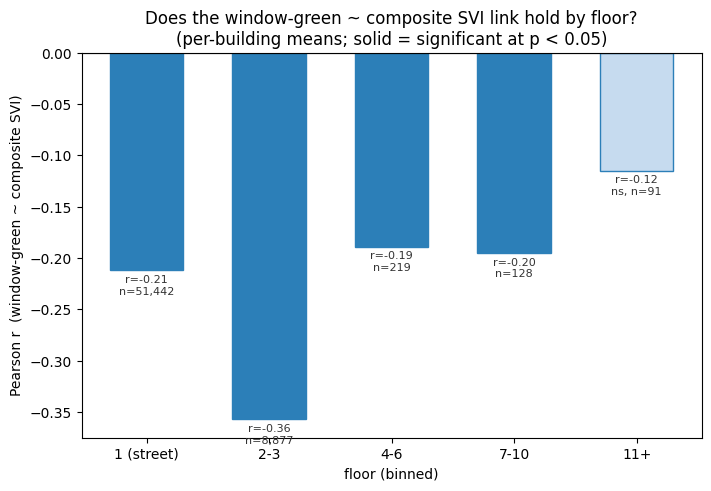

In [25]:
# The green-vulnerability link by floor (per-building means; n = buildings)
display(uw.svi_green_by_floor(pv_city, g_city))
uw.plot_svi_green_by_floor(pv_city, g_city); plt.show()

**Reading it.** `green ~ SVI` is negative and significant at every floor band up through 7-10 (*n* from ~51,000 at the street down to ~130), and is actually strongest in the 2-3 band (r≈-0.36). Only at 11+ (*n*≈91 tall buildings) does the estimate - still negative - lose significance. The green-vulnerability gap holds as you climb and becomes *unmeasurable* only at the very top, where too few buildings reach.

**4. Mapping the four sub-themes** - per building (points).

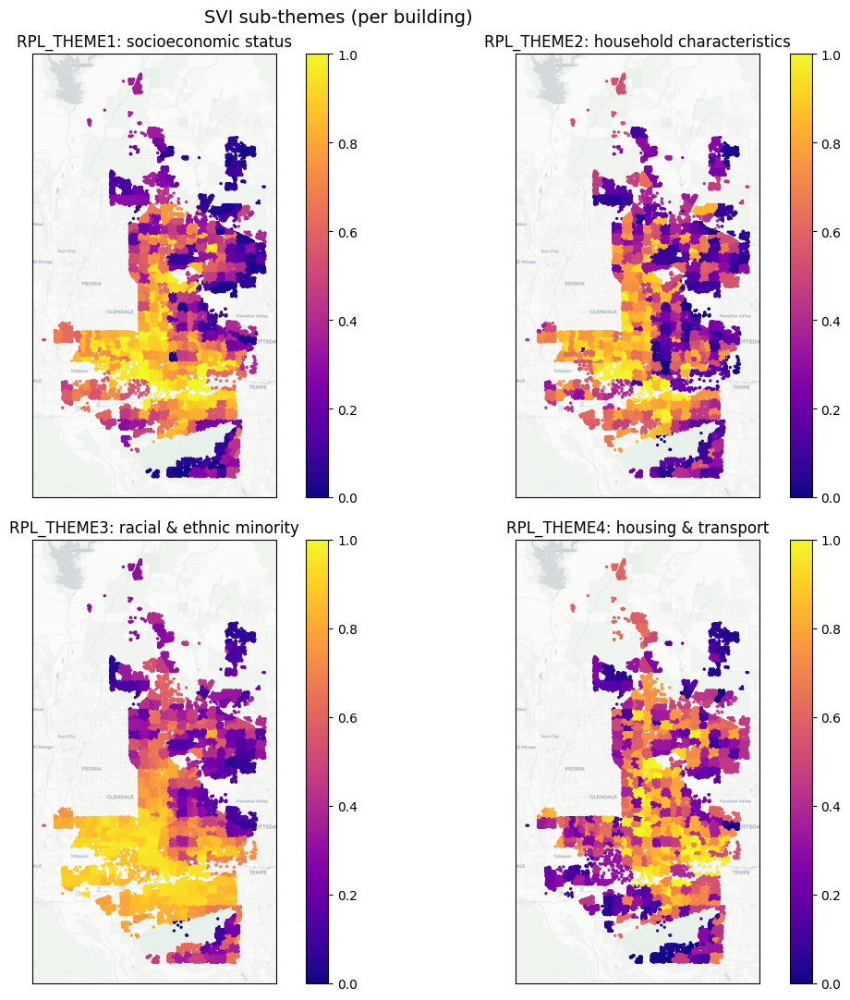

In [26]:
uw.plot_svi_theme_maps_pts(g_se); plt.show()

*Same, by census tract* (choropleth - SVI's native level).

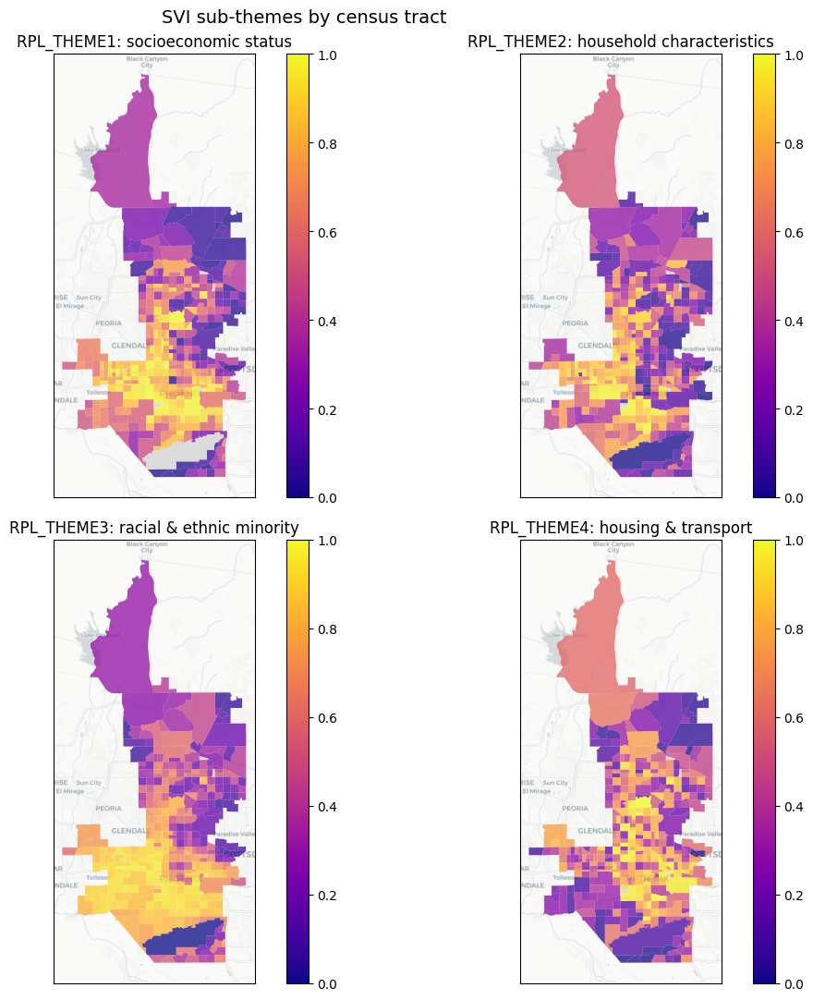

In [27]:
uw.plot_svi_theme_maps(SVI_TRACTS, geoids=g_se["GEOID"]); plt.show()

**Composite SVI and window-green** - per building (points).

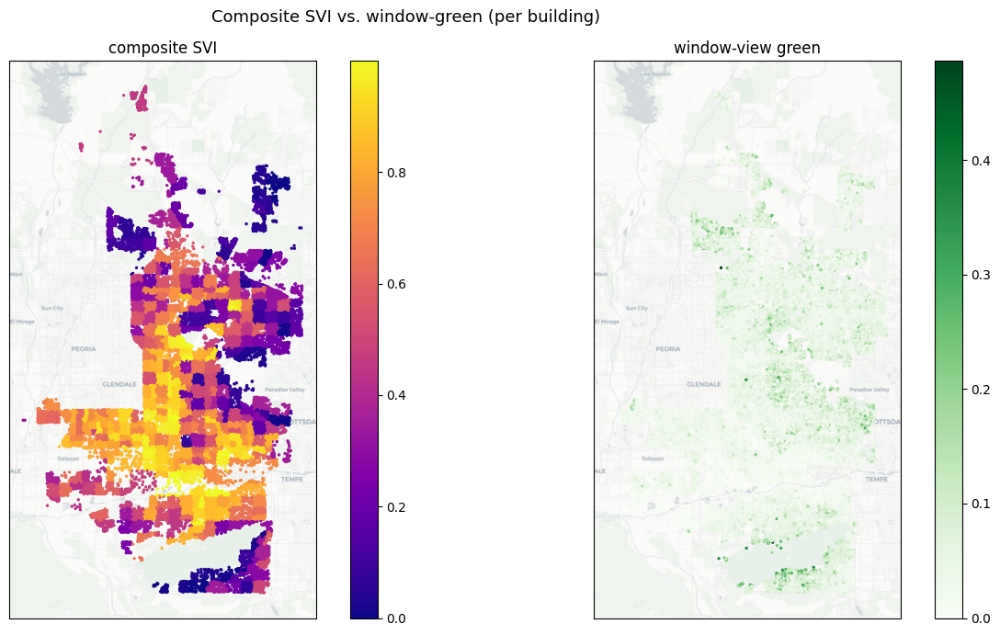

In [28]:
uw.plot_svi_green_maps_pts(g_se); plt.show()

*Same, by census tract.*

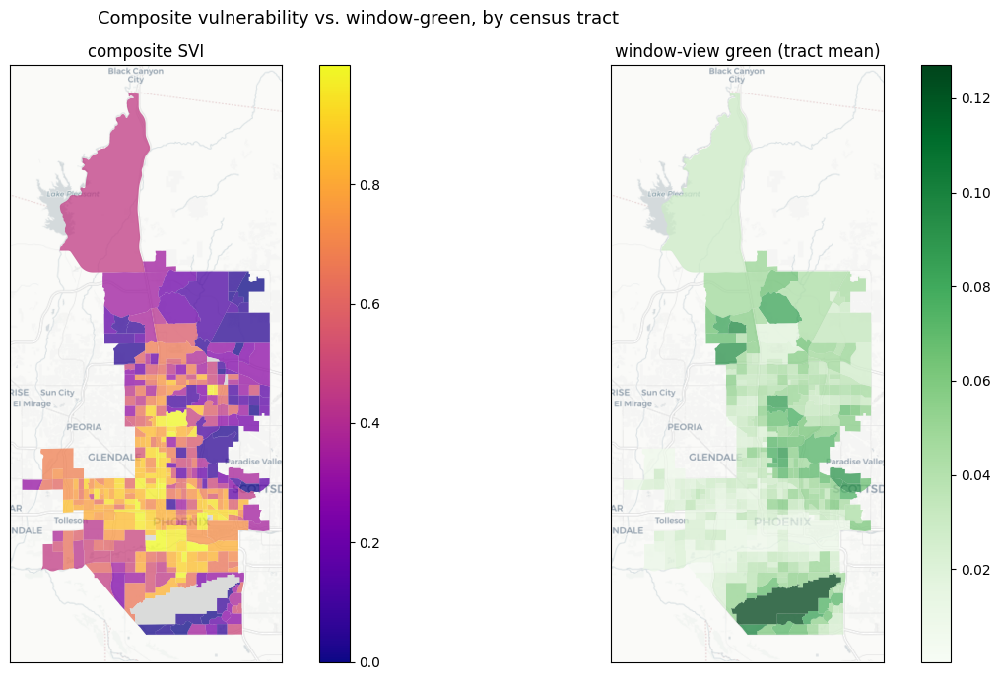

In [29]:
uw.plot_tract_svi_green(SVI_TRACTS, g_se); plt.show()

# Comparative Analysis: Phoenix vs Houston

UrbanWindow began in **Houston** — a humid, greener city, and the origin of the method and the segmentation model. Comparing it against desert Phoenix tests which relationships are city-specific and which transfer.

**Houston dataset.** Houston is one of the largest and most spatially diverse cities in the United States, covering approximately 4,600 km². The dataset is a stratify-sample approximately 10% of low- and mid-rise buildings by ZIP code while retaining all high-rise buildings, run the identical pipeline, and reduce the result to a **building-level** table (`green`, `lst`, `svi`, `rise_class`, `n_floors`).

**Building-level summary.** Side-by-side means for the shared continuous metrics (window green, surface heat, vulnerability), building counts by rise class, and the total building count per city.

In [30]:
import importlib
importlib.reload(uw)
hou = uw.load_houston(DATA_DIR.parent / "houston_buildings_enriched.csv")
uw.city_summary(g_city, hou)

,Phoenix,Houston
Window green (mean),0.040,0.226
LST (mean),56.75,47.12
SVI (mean),0.543,0.573
"Low-rise (count, %)","50,765 (98.5%)","32,592 (68.7%)"
"Mid-rise (count, %)",637 (1.2%),"12,743 (26.9%)"
"High-rise (count, %)",117 (0.2%),"2,104 (4.4%)"
Total buildings,"51,519","47,439"


### Correlation of window-view green with each of NDVI, LST, and SVI for Phoenix and Houston.

In [31]:
uw.green_correlations({"Phoenix": g_city, "Houston": hou})

,Phoenix,Houston
green ~ NDVI,0.32,0.39
green ~ urban heat,-0.34,-0.28
green ~ social vulnerability,-0.27,0.13


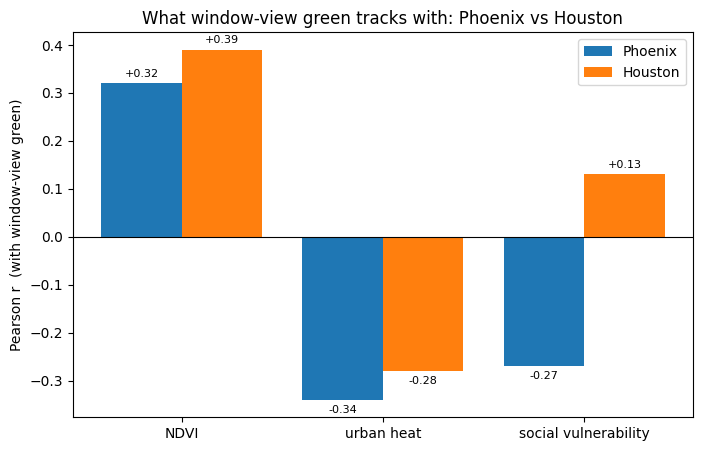

In [32]:
uw.plot_green_correlations({"Phoenix": g_city, "Houston": hou}); plt.show()

### Correlations split by rise class

Does the pattern hold within each building form? The same three correlations, computed separately for low-, mid-, and high-rise, per city. The `n` columns matter: Phoenix's sample has only 637 mid-rise and 117 high-rise buildings, so those coefficients are noisy and should be read as indicative, not firm.

In [33]:
uw.green_correlations_by_rise({"Phoenix": g_city, "Houston": hou})

Phoenix                                          Houston             \
             NDVI urban heat social vulnerability        n    NDVI urban heat   
low-rise     0.31      -0.34                -0.27  50765.0    0.38      -0.26   
mid-rise     0.51      -0.41                -0.33    637.0    0.41      -0.30   
high-rise    0.42      -0.01                -0.18    117.0    0.69      -0.52   

                                         
          social vulnerability        n  
low-rise                  0.22  32592.0  
mid-rise                  0.09  12743.0  
high-rise                -0.36   2104.0

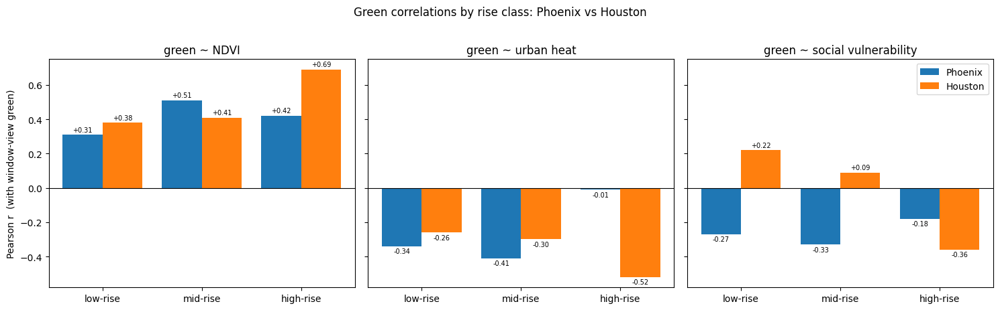

In [34]:
uw.plot_green_correlations_by_rise({"Phoenix": g_city, "Houston": hou}); plt.show()

### Green vs. NDVI, cross-city

Houston now carries an `ndvi` column, so the deferred comparison is live: window-view green against top-down NDVI, Phoenix beside Houston. Both correlations are positive and similar in strength - greener-from-above places do read greener from the window in both cities - with Houston a touch tighter (about +0.39 vs +0.32).

              Phoenix  Houston
green ~ NDVI     0.32     0.39


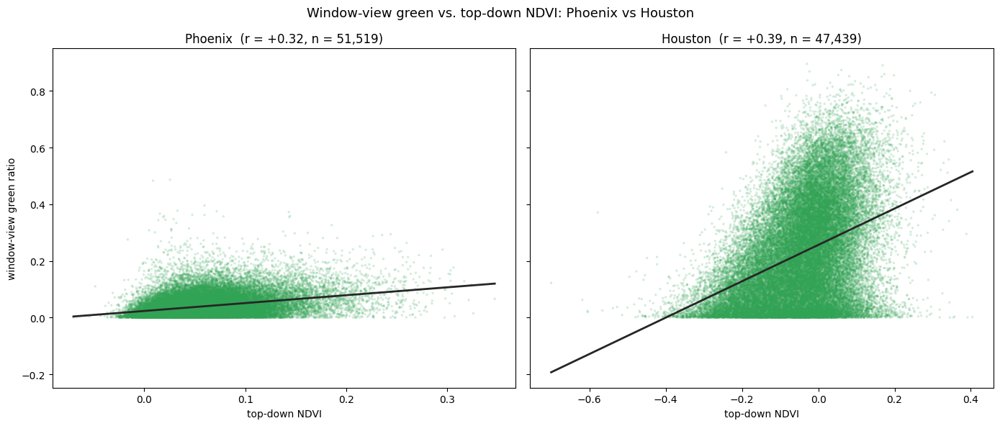

In [35]:
# Cross-city green ~ NDVI (activated now that Houston carries NDVI)
print(uw.green_correlations({"Phoenix": g_city, "Houston": hou}, drivers=("ndvi",)))
uw.plot_green_vs_ndvi_cities({"Phoenix": g_city, "Houston": hou}); plt.show()

### Houston: top-down NDVI vs. window-green (per building)

Top-down **NDVI** beside window-view green. The gap between the two is UrbanWindow's core point: satellite greenness and what people actually see from a window are related but not identical.

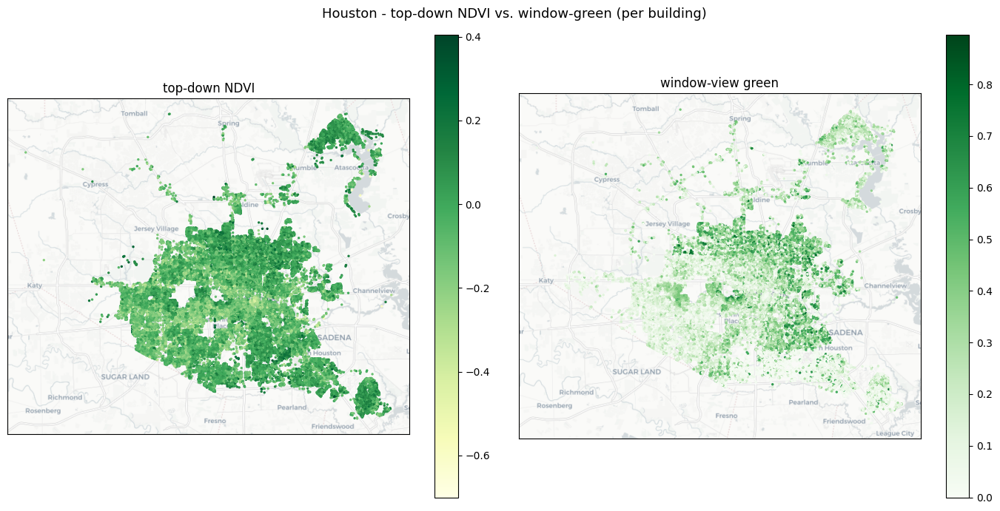

In [36]:
uw.plot_metric_green_maps_pts(hou, metric="ndvi", cmap="YlGn",
                              metric_label="top-down NDVI",
                              title="Houston - top-down NDVI vs. window-green (per building)"); plt.show()

### Houston: surface heat vs. window-green (per building)

The same building-level equity map for **surface heat (LST)** - hotter surfaces on the left, window-view green on the right. With the NDVI map above and the SVI map below, this completes the vulnerability / heat / vegetation set for Houston.

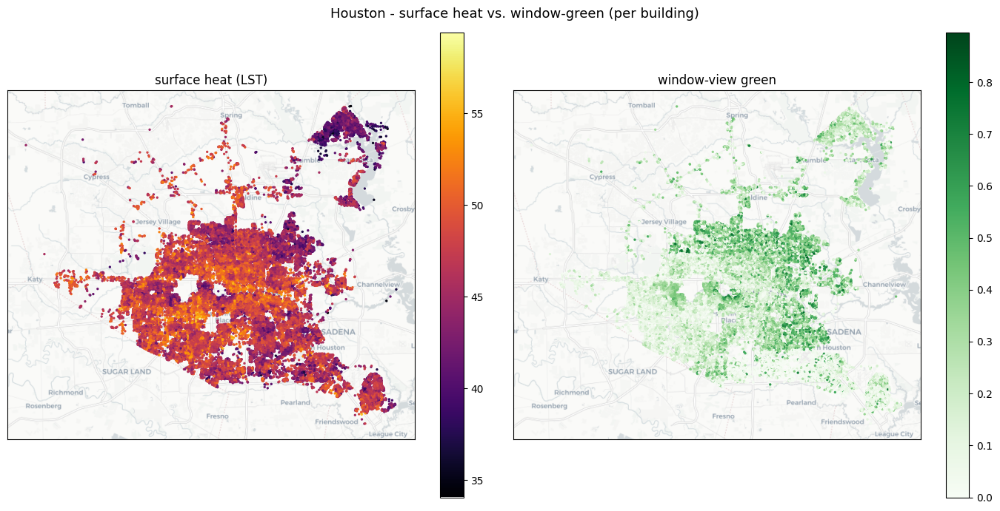

In [37]:
uw.plot_metric_green_maps_pts(hou, metric="lst", cmap="inferno",
                              metric_label="surface heat (LST)",
                              title="Houston - surface heat vs. window-green (per building)"); plt.show()

### Houston: composite SVI vs. window-green (per building)

The Q4 equity map, rebuilt for Houston at building level — vulnerability on the left, window-view green on the right. Because `green ~ social vulnerability` is *positive* in Houston (+0.13), the two panels should broadly agree rather than invert, unlike Phoenix.

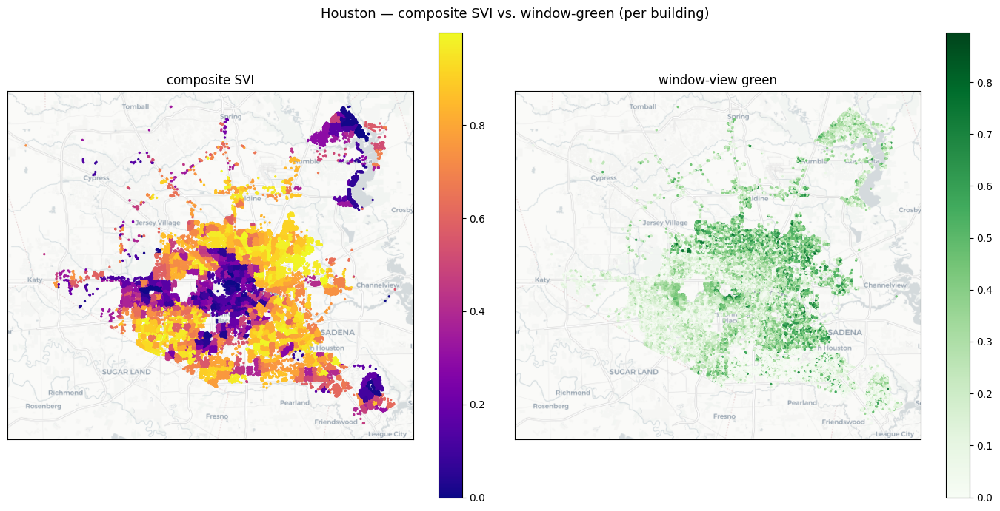

In [38]:
uw.plot_svi_green_maps_pts(hou, title="Houston — composite SVI vs. window-green (per building)"); plt.show()

Split by rise class — the same SVI vs. window-green maps for low-, mid-, and high-rise separately (green shares one colour scale across the three rows for comparability).

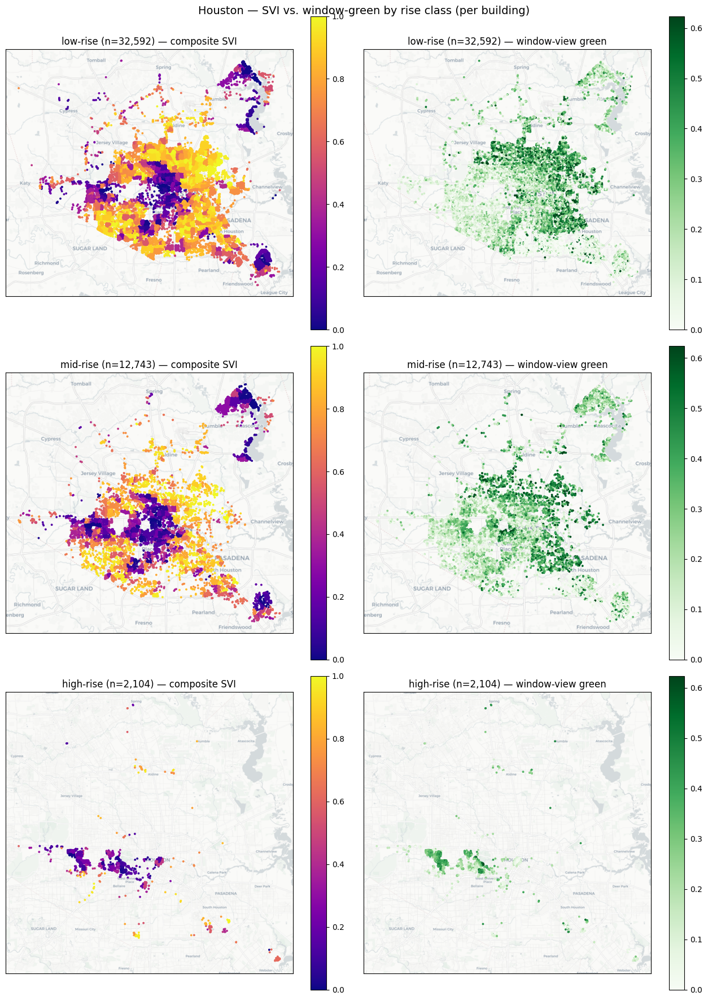

In [39]:
uw.plot_svi_green_maps_by_rise(hou, title="Houston — SVI vs. window-green by rise class (per building)"); plt.show()

## Model Card: window-view segmentation model

**Model.** DeepLabV3-ResNet50, the Phoenix window-view segmenter. Base: torchvision DeepLabV3-ResNet50; deployed version: Phoenix desert fine-tune (`best_model_phoenix.pth`, 2026).

**Architecture credits.** DeepLabV3, Google Research (Chen, Papandreou, Schroff, Adam, 2017); ResNet50, Microsoft Research (He, Zhang, Ren, Sun, 2015). Fine-tuning and pseudo-labeling by I-GUIDE Summer School 2026, Team 3.

**Use case.** Segments a rendered building window view into seven classes (Vegetation, Building, Sky, Road, Waterbody, Vehicle, Terrain). The window-view green ratio is the vegetation pixel fraction.

**Training data.** 168 Phoenix window-view frames with double-verified pseudo-labels: ADE20K SegFormer-B4 gives the class mask (150 classes collapsed to our 7), SAM gives class-agnostic regions with pixel-accurate edges, a majority vote per SAM region merges them, and a human check (Label Studio) scored a held-out subset by IoU. The base model was trained on humid Houston and failed on bare desert, which motivated the desert fine-tune.

**Evaluation.** Held-out Phoenix frames, per-class IoU. Gains after fine-tuning: Terrain 0.00 to 0.31, Vegetation 0.17 to 0.41, Road 0.16 to 0.40, Building 0.69 to 0.82, Sky 0.88 to 0.99.

**Limitations and ethics.** Labels are pseudo-generated, which can introduce bias, and the imagery is desert-city specific. After fine-tuning the model transfers much better to Phoenix, but a markedly different city still needs re-checking. Suitable for research on urban greenness, heat, and equity; not for individual surveillance or property-level regulatory decisions.

**License and availability.** Base model open source (torchvision/PyTorch, BSD-3-Clause); fine-tuned weights released for research use, kept with the fine-tuning materials and baked into the Anvil container.

## Credits
- **Method and Houston case study:** Zongrong Li, GEAR Lab, Texas A&M (advisor Dr. Lei Zou). *Seeing Green from Indoors in 3D* (https://papers.ssrn.com/sol3/papers.cfm?abstract_id=6766522). 
- **Data:** Google Photorealistic 3D Tiles (Cesium ion), GlobalBuildingAtlas, Sentinel-2 NDVI, Landsat LST, CDC/ATSDR SVI 2022, Census TIGER.